In [1]:
#import libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns

# Predict Clicked Ads Customer Classification by using Machine Learning

In [2]:
df = pd.read_csv('Clicked Ads Dataset.csv')

# 1.0 EDA

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                1000 non-null   int64  
 1   Daily Time Spent on Site  987 non-null    float64
 2   Age                       1000 non-null   int64  
 3   Area Income               987 non-null    float64
 4   Daily Internet Usage      989 non-null    float64
 5   Male                      997 non-null    object 
 6   Timestamp                 1000 non-null   object 
 7   Clicked on Ad             1000 non-null   object 
 8   city                      1000 non-null   object 
 9   province                  1000 non-null   object 
 10  category                  1000 non-null   object 
dtypes: float64(3), int64(2), object(6)
memory usage: 86.1+ KB


Based on a quick glance, the data has 1000 rows and 11 columns with 4 columns with a missing values, namely 'Daily Time Spent on Site', 'Area Income', 'Daily Internet Usage', and 'Male'. 

In [4]:
df.head()

,Unnamed: 0,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Timestamp,Clicked on Ad,city,province,category
0,0,68.95,35,432837300.0,256.09,Perempuan,3/27/2016 0:53,No,Jakarta Timur,Daerah Khusus Ibukota Jakarta,Furniture
1,1,80.23,31,479092950.0,193.77,Laki-Laki,4/4/2016 1:39,No,Denpasar,Bali,Food
2,2,69.47,26,418501580.0,236.50,Perempuan,3/13/2016 20:35,No,Surabaya,Jawa Timur,Electronic
3,3,74.15,29,383643260.0,245.89,Laki-Laki,1/10/2016 2:31,No,Batam,Kepulauan Riau,House
4,4,68.37,35,517229930.0,225.58,Perempuan,6/3/2016 3:36,No,Medan,Sumatra Utara,Finance


In [5]:
# Change the data type from object to datetime for column 'Timestamp'
df['Timestamp'] = pd.to_datetime(df['Timestamp'],  dayfirst=False )

In [6]:
# Group columns based on data types
numer_var = ['Daily Time Spent on Site', 'Age','Area Income','Daily Internet Usage']
cat_var = ['city','province','category']
bool_var = ['Male','Clicked on Ad']
timestamp_var = ['Timestamp']

In [7]:
df_bool = df[bool_var]

for i in df_bool:
    print("-" * 30) 
    print(f'Columns: {i}')
    print(df_bool[i].value_counts())
print("=" * 30) 

------------------------------
Columns: Male
Male
Perempuan    518
Laki-Laki    479
Name: count, dtype: int64
------------------------------
Columns: Clicked on Ad
Clicked on Ad
No     500
Yes    500
Name: count, dtype: int64


In [8]:
df['province'].value_counts()

province
Daerah Khusus Ibukota Jakarta    253
Jawa Barat                       210
Jawa Timur                        90
Banten                            76
Jawa Tengah                       53
Sumatra Utara                     48
Sumatra Selatan                   42
Kepulauan Riau                    34
Kalimantan Timur                  34
Sulawesi Selatan                  33
Lampung                           29
Kalimantan Selatan                23
Riau                              23
Bali                              21
Sumatra Barat                     19
Kalimantan Barat                  12
Name: count, dtype: int64

In [9]:
df['province'].nunique()

16

Customers are located in 16 province with most customers located in DKI Jakarta and Jawa Barat.

In [10]:
df['city'].value_counts()

city
Surabaya             64
Bandung              64
Jakarta Timur        63
Jakarta Selatan      61
Jakarta Barat        57
Bekasi               56
Medan                48
Jakarta Utara        45
Palembang            42
Semarang             41
Batam                34
Makassar             33
Tangerang Selatan    33
Tangerang            32
Depok                30
Bandar Lampung       29
Bogor                28
Jakarta Pusat        27
Malang               26
Banjarmasin          23
Pakanbaru            23
Denpasar             21
Padang               19
Balikpapan           18
Cimahi               17
Samarinda            16
Tasikmalaya          15
Pontianak            12
Surakarta            12
Serang               11
Name: count, dtype: int64

In [11]:
df['city'].nunique()

30

The customers are located in a total of 30 cities with Surabaya and Bandung as the city most customers located. 

In [12]:
df['category'].value_counts()

category
Otomotif      112
House         109
Health        104
Fashion       102
Food           99
Furniture      98
Travel         98
Electronic     97
Finance        91
Bank           90
Name: count, dtype: int64

In [13]:
df['category'].nunique()

10

The category most selected by the customers is Otomotif, followed by House, Health and Fashion. The least selected categories are Electronic, Finance, and Bank. 

In [14]:
df.describe()

,Unnamed: 0,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Timestamp
count,1000.000000,987.000000,1000.000000,9.870000e+02,989.000000,1000
mean,499.500000,64.929524,36.009000,3.848647e+08,179.863620,2016-04-10 10:33:36.840000
min,0.000000,32.600000,19.000000,9.797550e+07,104.780000,2016-01-01 02:52:00
25%,249.750000,51.270000,29.000000,3.286330e+08,138.710000,2016-02-18 02:55:15
50%,499.500000,68.110000,35.000000,3.990683e+08,182.650000,2016-04-07 17:27:00
75%,749.250000,78.460000,42.000000,4.583554e+08,218.790000,2016-05-31 03:18:00
max,999.000000,91.430000,61.000000,5.563936e+08,267.010000,2016-07-24 00:22:00
std,288.819436,15.844699,8.785562,9.407999e+07,43.870142,NaN


- Age: 19-61 years old, mean (36) > median (35), slightly positive distribution
- Area Income: in the range of 97.975.500 -  556.393.600 million, median (399.068.320) > mean (384.864.670), slightly negative distribution
- Daily Time Spent on Site: min 32.6 to 91 mins, median (68) > mean (65), slightly negative distribution
- Daily Internet Usage: 105-267 gb?, median (183) > mean (180), slightly negative distribution

## 1.1 Univariate Analysis

### 1.1.1 Numerical 

In [15]:
numer_var

['Daily Time Spent on Site', 'Age', 'Area Income', 'Daily Internet Usage']

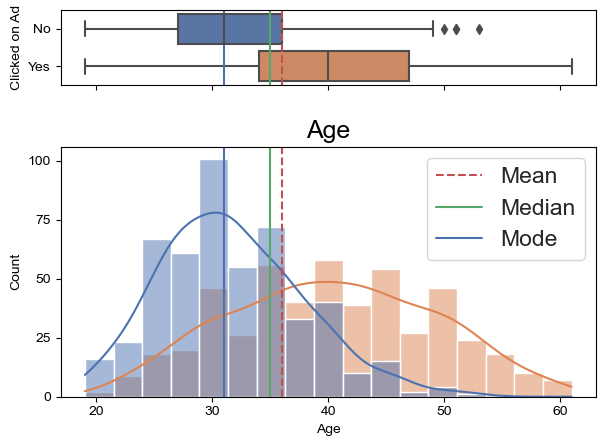

In [16]:
# Age
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.3, 1)})
sns.set(rc={'figure.figsize':(11,8)}, font_scale=1.5, style='whitegrid')
mean=df['Age'].mean()
median=df['Age'].median()
mode=df['Age'].mode().values[0]

age = sns.boxplot(data=df, x="Age", y="Clicked on Ad", ax=ax_box, order= df["Clicked on Ad"].value_counts().index)
ax_box.axvline(mean, color='r', linestyle='--')
ax_box.axvline(median, color='g', linestyle='-')
ax_box.axvline(mode, color='b', linestyle='-')

sns.histplot(data=df, x="Age", hue='Clicked on Ad',ax=ax_hist, kde=True)
ax_hist.axvline(mean, color='r', linestyle='--', label="Mean")
ax_hist.axvline(median, color='g', linestyle='-', label="Median")
ax_hist.axvline(mode, color='b', linestyle='-', label="Mode")
ax_hist.legend()
ax_box.set(xlabel='')
plt.title('Age')
plt.tight_layout()

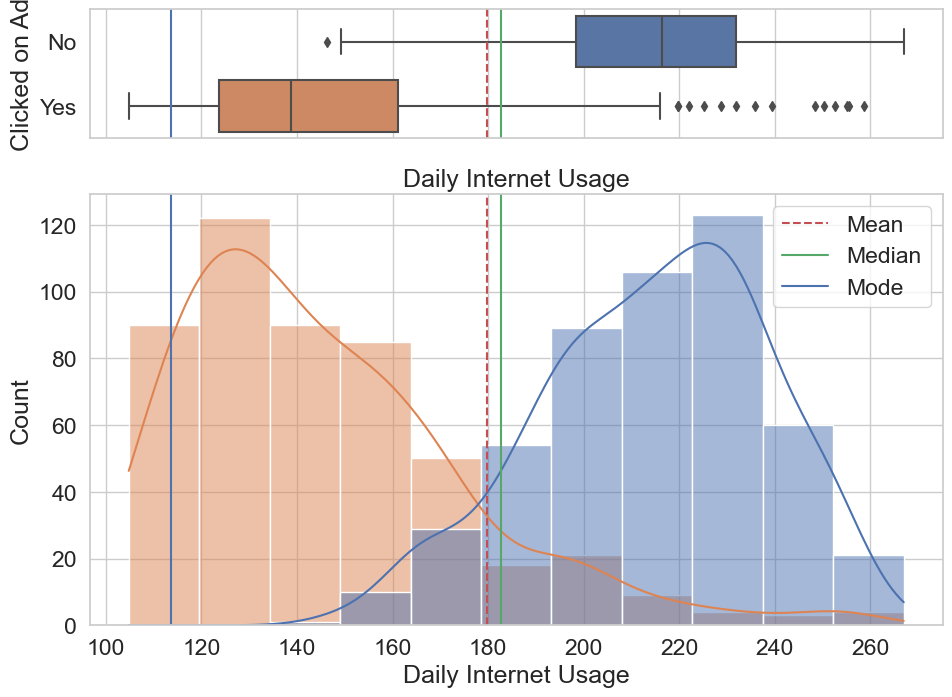

In [17]:
# Daily Internet Usage
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.3, 1)})
sns.set(rc={'figure.figsize':(11,8)}, font_scale=1.5, style='whitegrid')
mean=df['Daily Internet Usage'].mean()
median=df['Daily Internet Usage'].median()
mode=df['Daily Internet Usage'].mode().values[0]

age = sns.boxplot(data=df, x="Daily Internet Usage", y="Clicked on Ad", ax=ax_box, order= df["Clicked on Ad"].value_counts().index)
ax_box.axvline(mean, color='r', linestyle='--')
ax_box.axvline(median, color='g', linestyle='-')
ax_box.axvline(mode, color='b', linestyle='-')

sns.histplot(data=df, x="Daily Internet Usage",hue='Clicked on Ad', ax=ax_hist, kde=True)
ax_hist.axvline(mean, color='r', linestyle='--', label="Mean")
ax_hist.axvline(median, color='g', linestyle='-', label="Median")
ax_hist.axvline(mode, color='b', linestyle='-', label="Mode")
ax_hist.legend()
ax_box.set(xlabel='')
plt.title('Daily Internet Usage');

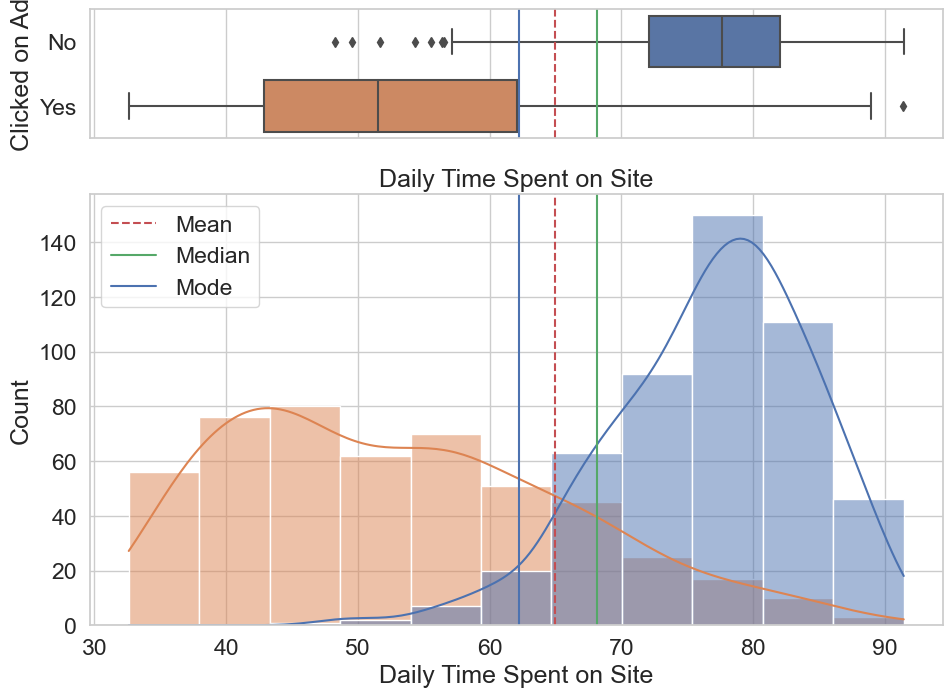

In [18]:
# Daily Time Spent on Site
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.3, 1)})
sns.set(rc={'figure.figsize':(11,8)}, font_scale=1.5, style='whitegrid')
mean=df['Daily Time Spent on Site'].mean()
median=df['Daily Time Spent on Site'].median()
mode=df['Daily Time Spent on Site'].mode().values[0]

age = sns.boxplot(data=df, x="Daily Time Spent on Site", y="Clicked on Ad", ax=ax_box, order= df["Clicked on Ad"].value_counts().index)
ax_box.axvline(mean, color='r', linestyle='--')
ax_box.axvline(median, color='g', linestyle='-')
ax_box.axvline(mode, color='b', linestyle='-')

sns.histplot(data=df, x="Daily Time Spent on Site",hue='Clicked on Ad', ax=ax_hist, kde=True)
ax_hist.axvline(mean, color='r', linestyle='--', label="Mean")
ax_hist.axvline(median, color='g', linestyle='-', label="Median")
ax_hist.axvline(mode, color='b', linestyle='-', label="Mode")
ax_hist.legend()
ax_box.set(xlabel='')
plt.title('Daily Time Spent on Site');

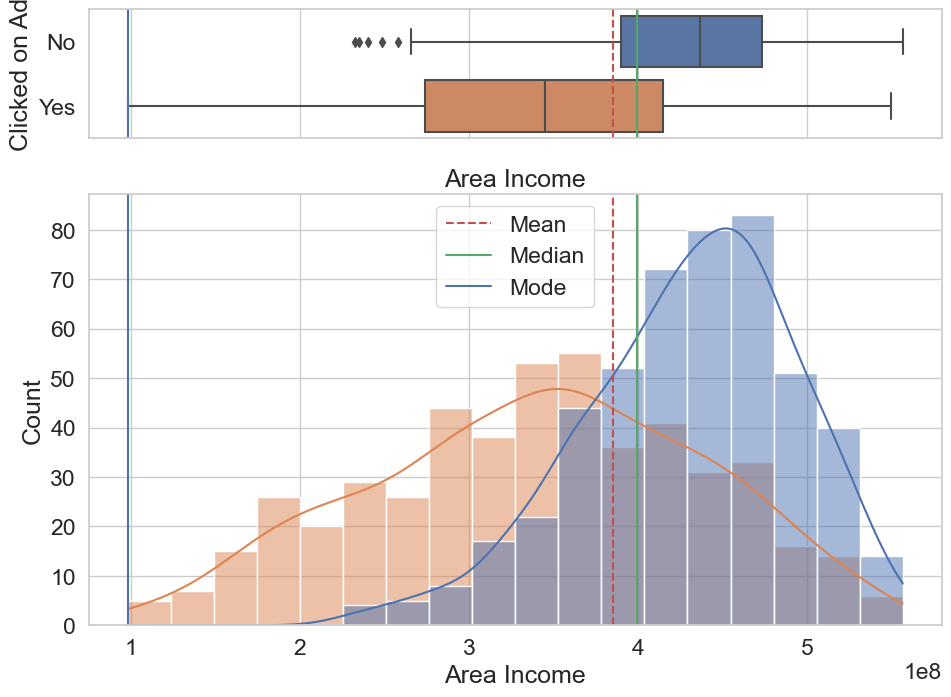

In [19]:
# Area Income
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.3, 1)})
sns.set(rc={'figure.figsize':(11,8)}, font_scale=1.5, style='whitegrid')
mean=df['Area Income'].mean()
median=df['Area Income'].median()
mode=df['Area Income'].mode().values[0]

age = sns.boxplot(data=df, x="Area Income", y="Clicked on Ad", ax=ax_box, order= df["Clicked on Ad"].value_counts().index)
ax_box.axvline(mean, color='r', linestyle='--')
ax_box.axvline(median, color='g', linestyle='-')
ax_box.axvline(mode, color='b', linestyle='-')

sns.histplot(data=df, x="Area Income",hue='Clicked on Ad', ax=ax_hist, kde=True)
ax_hist.axvline(mean, color='r', linestyle='--', label="Mean")
ax_hist.axvline(median, color='g', linestyle='-', label="Median")
ax_hist.axvline(mode, color='b', linestyle='-', label="Mode")
ax_hist.legend()
ax_box.set(xlabel='')
plt.title('Area Income');

### 1.1.2 Categorical

In [20]:
cat_var

['city', 'province', 'category']

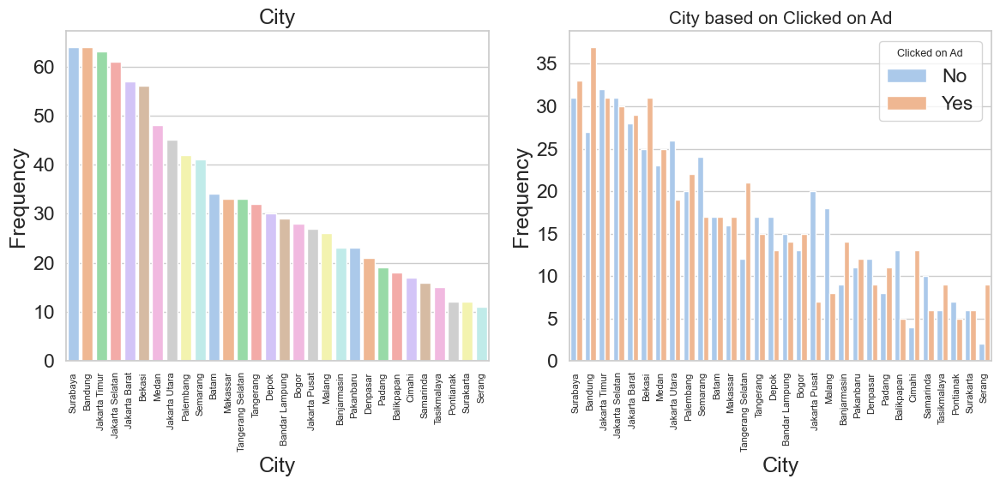

In [21]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

sns.countplot(x='city', data=df, palette='pastel', order=df["city"].value_counts().index, ax=axes[0])
axes[0].set_xlabel('City')
axes[0].set_ylabel('Frequency')
axes[0].tick_params(axis='x', which='major', labelsize=8)
axes[0].tick_params(axis='x', rotation=90)
axes[0].set_title('City')

sns.countplot(x='city', data=df, hue='Clicked on Ad', palette='pastel', order=df["city"].value_counts().index, ax=axes[1])
axes[1].set_xlabel('City')
axes[1].set_ylabel('Frequency')
axes[1].tick_params(axis='x', which='major', labelsize=8)
axes[1].tick_params(axis='x', rotation=90)
axes[1].legend(title='Clicked on Ad', title_fontsize=9, loc='upper right')
axes[1].set_title('City based on Clicked on Ad', fontsize=15)

plt.tight_layout()

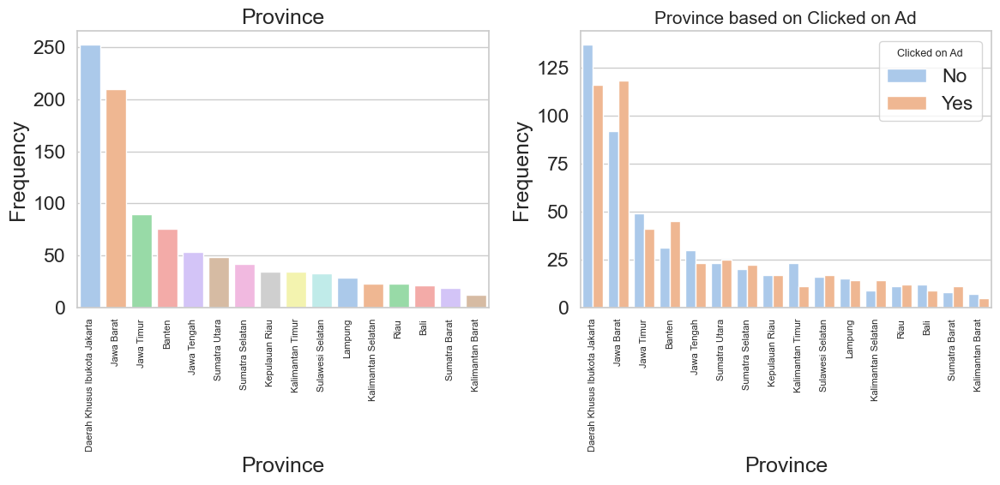

In [22]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

sns.countplot(x='province', data=df, palette='pastel', order=df["province"].value_counts().index, ax=axes[0])
axes[0].set_xlabel('Province')
axes[0].set_ylabel('Frequency')
axes[0].tick_params(axis='x', which='major', labelsize=8)
axes[0].tick_params(axis='x', rotation=90)
axes[0].set_title('Province')

sns.countplot(x='province', data=df, hue='Clicked on Ad', palette='pastel', order=df["province"].value_counts().index, ax=axes[1])
axes[1].set_xlabel('Province')
axes[1].set_ylabel('Frequency')
axes[1].tick_params(axis='x', which='major', labelsize=8)
axes[1].tick_params(axis='x', rotation=90)
axes[1].legend(title='Clicked on Ad', title_fontsize=9, loc='upper right')
axes[1].set_title('Province based on Clicked on Ad', fontsize=15)

plt.tight_layout()

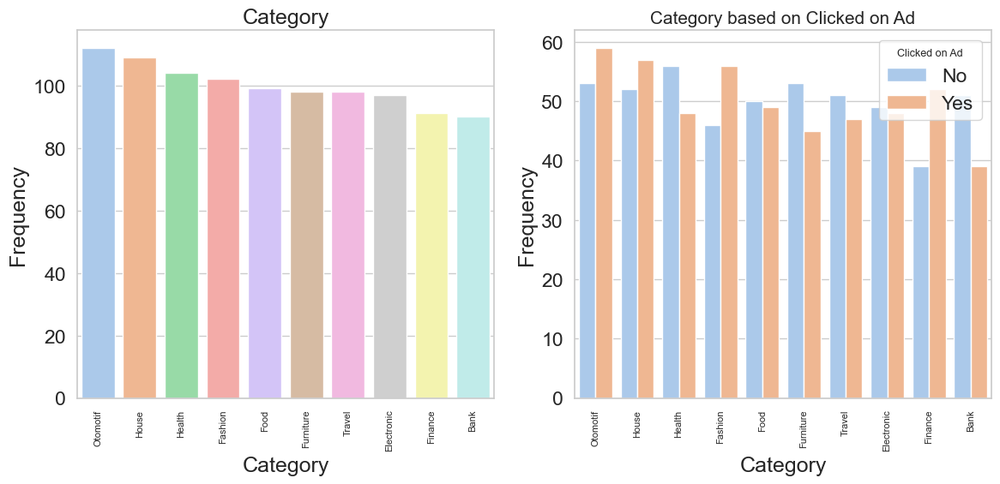

In [23]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

sns.countplot(x='category', data=df, palette='pastel', order=df["category"].value_counts().index, ax=axes[0])
axes[0].set_xlabel('Category')
axes[0].set_ylabel('Frequency')
axes[0].tick_params(axis='x', which='major', labelsize=8)
axes[0].tick_params(axis='x', rotation=90)
axes[0].set_title('Category')

sns.countplot(x='category', data=df, hue='Clicked on Ad', palette='pastel', order=df["category"].value_counts().index, ax=axes[1])
axes[1].set_xlabel('Category')
axes[1].set_ylabel('Frequency')
axes[1].tick_params(axis='x', which='major', labelsize=8)
axes[1].tick_params(axis='x', rotation=90)
axes[1].legend(title='Clicked on Ad', title_fontsize=9, loc='upper right')
axes[1].set_title('Category based on Clicked on Ad', fontsize=15)

plt.tight_layout()

In [24]:
bool_var

['Male', 'Clicked on Ad']

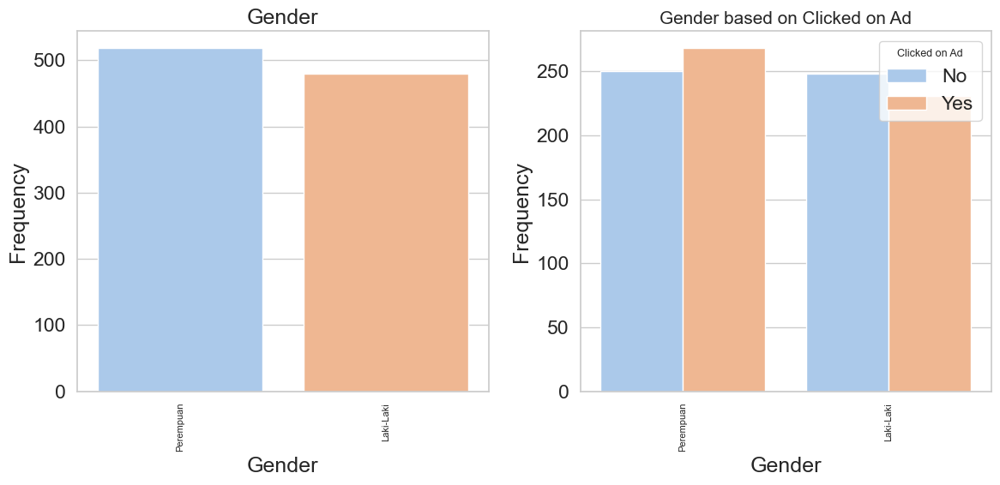

In [25]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

sns.countplot(x='Male', data=df, palette='pastel', order=df["Male"].value_counts().index, ax=axes[0])
axes[0].set_xlabel('Gender')
axes[0].set_ylabel('Frequency')
axes[0].tick_params(axis='x', which='major', labelsize=8)
axes[0].tick_params(axis='x', rotation=90)
axes[0].set_title('Gender')

sns.countplot(x='Male', data=df, hue='Clicked on Ad', palette='pastel', order=df["Male"].value_counts().index, ax=axes[1])
axes[1].set_xlabel('Gender')
axes[1].set_ylabel('Frequency')
axes[1].tick_params(axis='x', which='major', labelsize=8)
axes[1].tick_params(axis='x', rotation=90)
axes[1].legend(title='Clicked on Ad', title_fontsize=9, loc='upper right')
axes[1].set_title('Gender based on Clicked on Ad', fontsize=15)

plt.tight_layout()

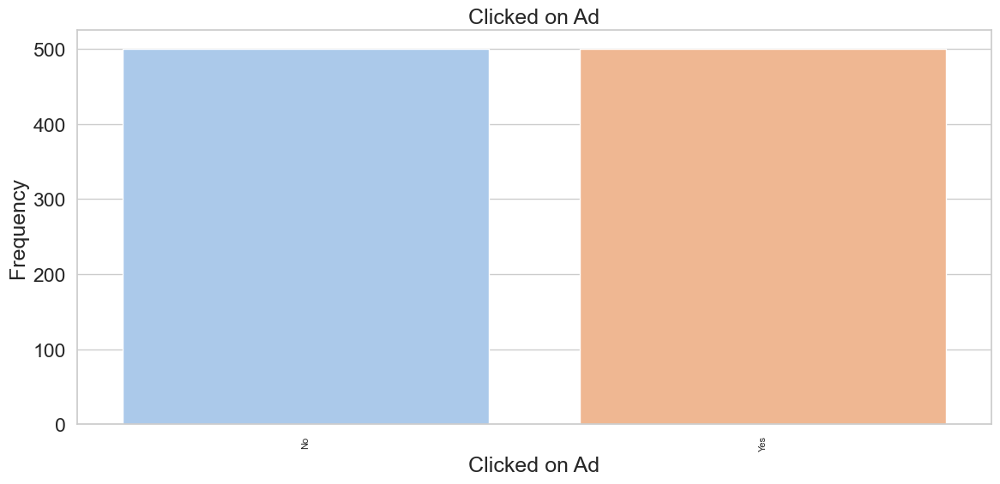

In [26]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))

sns.countplot(x='Clicked on Ad', data=df, palette='pastel', order=df["Clicked on Ad"].value_counts().index, ax=ax)
ax.set_xlabel('Clicked on Ad')
ax.set_ylabel('Frequency')
ax.tick_params(axis='x', which='major', labelsize=8)
ax.tick_params(axis='x', rotation=90)
ax.set_title('Clicked on Ad')

plt.tight_layout()

## 1.2 Bivariate Analysis

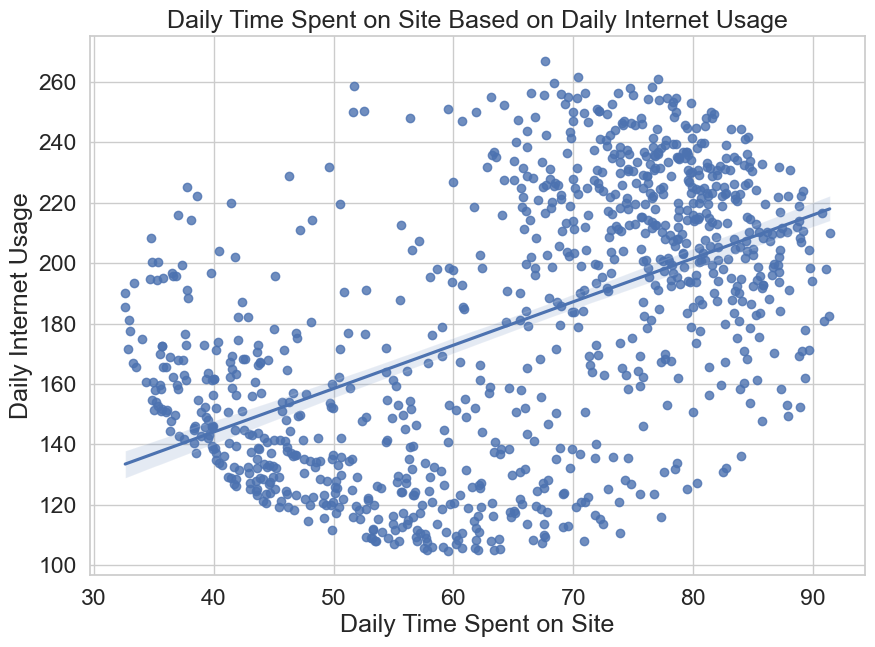

In [27]:
# Daily Time Spent on Site Based on Daily Internet Usage

plt.figure(figsize = (10,7))
sns.regplot(x='Daily Time Spent on Site',y='Daily Internet Usage',data = df)
plt.title('Daily Time Spent on Site Based on Daily Internet Usage')
plt.show()

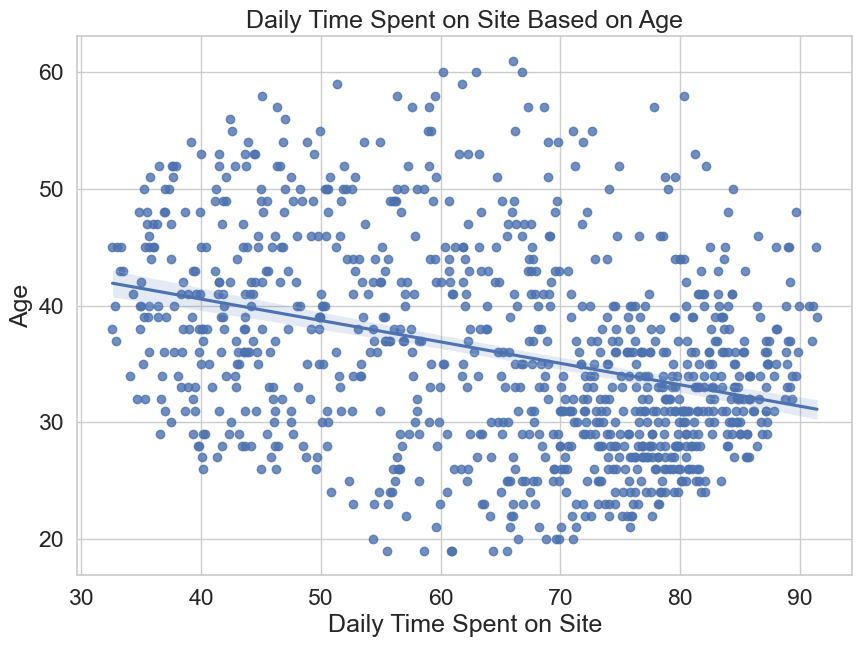

In [28]:
# Daily Time Spent on Site Based on Age

plt.figure(figsize = (10,7))
sns.regplot(x='Daily Time Spent on Site',y='Age',data = df)
plt.title('Daily Time Spent on Site Based on Age')
plt.show()

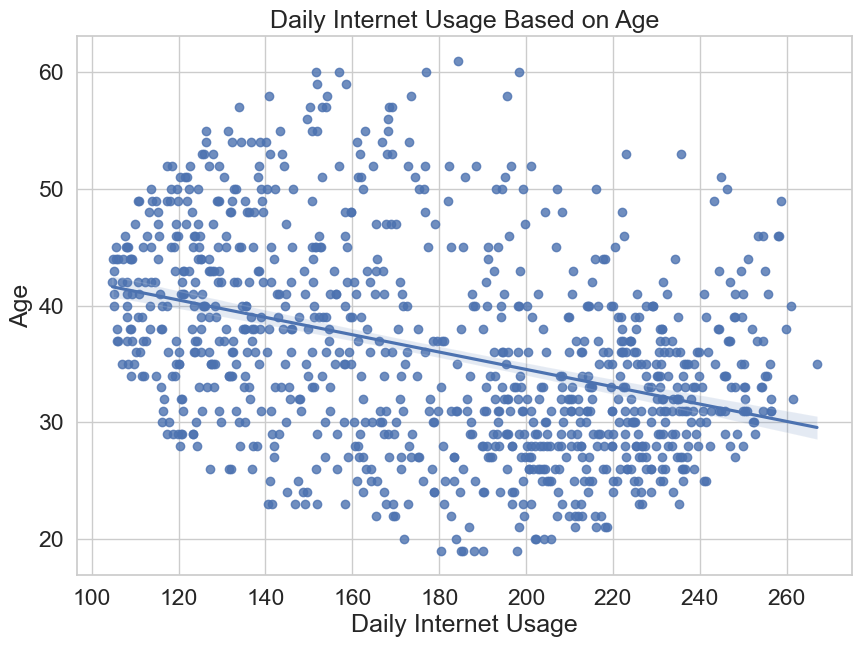

In [29]:
# Daily Internet Usage Based on Age

plt.figure(figsize = (10,7))
sns.regplot(x='Daily Internet Usage',y='Age',data = df)
plt.title('Daily Internet Usage Based on Age')
plt.show()

## 1.3 Multivariate Analysis

In [30]:
# Drop the first column (Unnamed: 0) as it's irrelevant
df_multivar = df.drop(columns=['Unnamed: 0'])

Text(0.5, 1.0, 'Pearson Correlation')

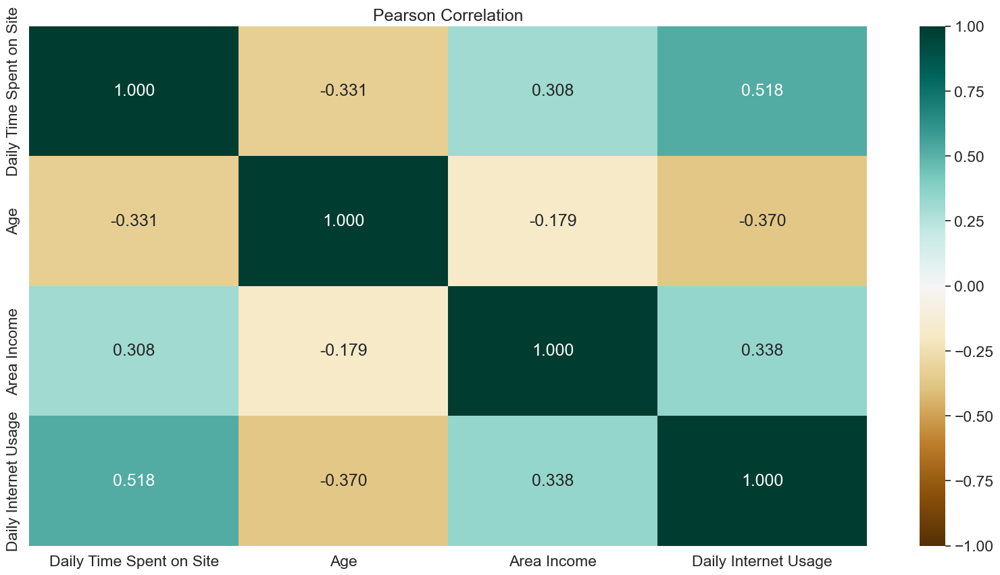

In [31]:
# Pearson correlation
plt.figure(figsize=(20,10))

sns.heatmap(df_multivar.corr(numeric_only=True,method='pearson'),
            fmt='.3f',
            annot=True,
            cmap='BrBG',
            vmin=-1)
plt.title('Pearson Correlation')

# 2.0 Data Cleaning & Preprocessing

### 2.1 Missing Value

In [32]:
df.isnull().sum()

Unnamed: 0                   0
Daily Time Spent on Site    13
Age                          0
Area Income                 13
Daily Internet Usage        11
Male                         3
Timestamp                    0
Clicked on Ad                0
city                         0
province                     0
category                     0
dtype: int64

As mentioned previously, there are 4 columns with missing values which are 'Daily Time Spent on Site', 'Area Income', 'Daily Internet Usage' and 'Male'

In [33]:
# Fill in missing value of numerical columns with the median
df['Daily Time Spent on Site'] = df['Daily Time Spent on Site'].fillna(df['Daily Time Spent on Site'].median())
df['Daily Internet Usage'] = df['Daily Internet Usage'].fillna(df['Daily Internet Usage'].median())
df['Area Income'] = df['Area Income'].fillna(df['Area Income'].median())

# Fill in missing value of categorical column with the mode
df['Male'] = df['Male'].fillna(df['Male'].mode()[0])

## 2.2 Duplicate Data

In [34]:
# Command to see any duplicated row in dataset
df[df.duplicated()]

,Unnamed: 0,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Timestamp,Clicked on Ad,city,province,category


## 2.3 Feature Engineering

### 2.3.1 Label Encoder

In [35]:
male_order = ['Perempuan', 'Laki-Laki']
df['Male_Ordinal'] = df['Male'].map(lambda x: male_order.index(x))


In [36]:
clickad_order = ['No', 'Yes']
df['clickad_Ordinal'] = df['Clicked on Ad'].map(lambda x: clickad_order.index(x))

### 2.3.2 One Hot Encoder

In [37]:
for cat in ['city']:
    onehots = pd.get_dummies(df[cat], prefix=cat)
    df = df.join(onehots)

In [38]:
for cat in ['province']:
    onehots = pd.get_dummies(df[cat], prefix=cat)
    df = df.join(onehots)

In [39]:
for cat in ['category']:
    onehots = pd.get_dummies(df[cat], prefix=cat)
    df = df.join(onehots)

### 2.3.3 Feature Extraction

In [40]:
# Extract day, month, week and year
df['Date_Day'] = df['Timestamp'].dt.weekday
df['Date_Month'] = df['Timestamp'].dt.month
df['Date_Year'] = df['Timestamp'].dt.year
df['Date_Week'] = df['Timestamp'].dt.isocalendar().week 

### 2.3.4 Feature Selection

In [41]:
# Drop irrelevant features and encoded features
df_dropped = df.drop(columns=['Unnamed: 0','Male','Clicked on Ad','city','province','category','Timestamp','Date_Year']).copy()

In [42]:
# Correlation Method
plt.figure(figsize=(60,30),dpi=700)
plt.rc('font', size=5) 
sns.heatmap(df_dropped.corr(numeric_only=True,method='pearson'),
            fmt='.3f',
            annot=True,
            cmap='BrBG',
            vmin=-1,
            annot_kws={'fontsize': 5})
plt.title('Pearson Correlation')

Text(0.5, 1.0, 'Pearson Correlation')

Redundant features

Strong Positive Correlation
- city_Bandar Lampung and province_Lampung r=1.000
- city_Balikpapan and province_Kalimantan Timur r=0.722
- city_Banjarmasin and province_Kalimantan Selatan r=1.000
- city_Batam and province_Kepulauan Riau r=1.000
- city_Makassar and province_Sulawesi Selatan r=1.000
- city_Medan and province_Sumatra Utara  r=1.000
- city_Padang and province_Sumatra Barat  r=1.000
- city_Pekanbaru and province_Riau  r=1.000
- city_Palembang and province_Sumatra Selatan r=1.000
- city_Pontianak and province_Kalimantan Barat r=1.000
- city_Semarang and province_Jawa Tengah r=0.874
- city_Surabaya and province_Jawa Timur r=0.831
- city_Denpasar and province_Bali r=1.000
- Date_Month and and Date_Week r=0.706

Strong Negative Correlation
- clicked_Ordinal and Daily Time Spent on Site r=-0.742
- clicked_Ordinal and Daily Internet Usage r=-0.786

In [43]:
# Drop redundant features
df_dropped2 = df_dropped.drop(columns=['province_Lampung','province_Kalimantan Timur','province_Kalimantan Selatan',
                                        'province_Kepulauan Riau','province_Sulawesi Selatan','province_Sumatra Utara',
                                        'province_Sumatra Barat','province_Riau','province_Sumatra Selatan',
                                        'province_Kalimantan Barat','province_Jawa Tengah','province_Jawa Timur','province_Bali']).copy()

In [44]:
df_dropped2 = df_dropped2.rename(columns={'clickad_Ordinal': 'clicked_on_ad'})

In [45]:
df_dropped2.describe()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male_Ordinal,clicked_on_ad,Date_Day,Date_Month,Date_Week
count,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.0
mean,64.970870,36.009000,3.850493e+08,179.894270,0.479000,0.50000,3.064000,3.817000,15.417
std,15.745394,8.785562,9.347971e+07,43.628915,0.499809,0.50025,1.998474,1.926973,9.713159
min,32.600000,19.000000,9.797550e+07,104.780000,0.000000,0.00000,0.000000,1.000000,1.0
25%,51.545000,29.000000,3.298201e+08,139.017500,0.000000,0.00000,1.000000,2.000000,8.0
50%,68.110000,35.000000,3.990683e+08,182.650000,0.000000,0.50000,3.000000,4.000000,15.0
75%,78.352500,42.000000,4.566932e+08,218.287500,1.000000,1.00000,5.000000,5.000000,22.0
max,91.430000,61.000000,5.563936e+08,267.010000,1.000000,1.00000,6.000000,7.000000,53.0


# 3.0 Modeling

## Split Data

In [46]:
# Split data to feature dan target
X = df_dropped2.drop(['clicked_on_ad'],axis=1)
y = df_dropped2.clicked_on_ad

# Split data set to data train and data test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [47]:
# Standardization
from sklearn.preprocessing import StandardScaler

num_var = ['Daily Time Spent on Site', 'Age', 'Area Income', 'Daily Internet Usage','Date_Day','Date_Month','Date_Week']
df_scaled = df_dropped2.copy()

for i in num_var:
    df_scaled[i] = StandardScaler().fit_transform(df_scaled[i].values.reshape(len(df_scaled), 1))

In [48]:
# Split Scaled Data
X_scaled = df_scaled.drop(['clicked_on_ad'],axis=1)
y_scaled = df_scaled.clicked_on_ad

# Split scaled data set to data train and data test
from sklearn.model_selection import train_test_split
X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test = train_test_split(X_scaled, y_scaled, test_size=0.3, random_state=42)


In [91]:
# Function for model evaluation
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestClassifier

def eval_classification(model):
    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)
    y_pred_proba = model.predict_proba(X_test)
    y_pred_proba_train = model.predict_proba(X_train)

    print("Accuracy (Test Set): %.2f" % accuracy_score(y_test, y_pred))
    print("Accuracy (Train Set): %.2f" % accuracy_score(y_train, y_pred_train))
    print("Precision (Test Set): %.2f" % precision_score(y_test, y_pred))
    print("Recall (Test Set): %.2f" % recall_score(y_test, y_pred))
    print("F1-Score (Test Set): %.2f" % f1_score(y_test, y_pred))

    print("roc_auc (test-proba): %.2f" % roc_auc_score(y_test, y_pred_proba[:, 1]))
    print("roc_auc (train-proba): %.2f" % roc_auc_score(y_train, y_pred_proba_train[:, 1]))
    #
    score = cross_validate(model, X, y, cv=5, scoring='recall', return_train_score=True)
    print('recall (crossval train): '+ str(score['train_score'].mean()))
    print('recall (crossval test): '+ str(score['test_score'].mean()))

def show_feature_importance(model):
    feat_importances = pd.Series(model.feature_importances_, index=X.columns)
    ax = feat_importances.nlargest(25).plot(kind='barh', figsize=(10, 8))
    ax.invert_yaxis()

    plt.xlabel('score')
    plt.ylabel('feature')
    plt.title('feature importance score')

def show_best_hyperparameter(model):
    print(model.best_estimator_.get_params())

# Function for confusion matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

def confusionmatrix(model):
    y_predicted = model.predict(X_test)
    cf = confusion_matrix(y_test, y_predicted)
    print(cf)

    # show confusion matrix
    fig,ax= plt.subplots(figsize=(7,7))
    fig_cfm= ConfusionMatrixDisplay(cf)
    fig_cfm.plot(ax=ax,text_kw={'fontsize': 20},cmap='Blues')
    
    plt.title('Confusion Matrix')  

In [92]:
# Function for model evaluation with scaled data
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestClassifier

def eval_classification_scaled(model):
    y_pred = model.predict(X_scaled_test)
    y_pred_train = model.predict(X_scaled_train)
    y_pred_proba = model.predict_proba(X_scaled_test)
    y_pred_proba_train = model.predict_proba(X_scaled_train)

    print("Accuracy (Test Set): %.2f" % accuracy_score(y_scaled_test, y_pred))
    print("Accuracy (Train Set): %.2f" % accuracy_score(y_scaled_train, y_pred_train))
    print("Precision (Test Set): %.2f" % precision_score(y_scaled_test, y_pred))
    print("Recall (Test Set): %.2f" % recall_score(y_scaled_test, y_pred))
    print("F1-Score (Test Set): %.2f" % f1_score(y_test, y_pred))

    print("roc_auc (test-proba): %.2f" % roc_auc_score(y_scaled_test, y_pred_proba[:, 1]))
    print("roc_auc (train-proba): %.2f" % roc_auc_score(y_scaled_train, y_pred_proba_train[:, 1]))
    #
    score = cross_validate(model, X_scaled, y_scaled, cv=5, scoring='recall', return_train_score=True)
    print('recall (crossval train): '+ str(score['train_score'].mean()))
    print('recall (crossval test): '+ str(score['test_score'].mean()))

def show_feature_importance(model):
    feat_importances = pd.Series(model.feature_importances_, index=X.columns)
    ax = feat_importances.nlargest(25).plot(kind='barh', figsize=(10, 8))
    ax.invert_yaxis()

    plt.xlabel('score')
    plt.ylabel('feature')
    plt.title('feature importance score')

def show_best_hyperparameter(model):
    print(model.best_estimator_.get_params())

# Function for confusion matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

def confusionmatrix_scaled(model):
    y_predicted = model.predict(X_scaled_test)
    cf = confusion_matrix(y_scaled_test, y_predicted)
    print(cf)

    # show confusion matrix
    fig,ax= plt.subplots(figsize=(7,7))
    fig_cfm= ConfusionMatrixDisplay(cf)
    fig_cfm.plot(ax=ax,text_kw={'fontsize': 20},cmap='Greens')
    plt.title('Confusion Matrix (Scaled)')  

## 3.1 Logistic Regression

Accuracy (Test Set): 0.49
Accuracy (Train Set): 0.51
Precision (Test Set): 0.00
Recall (Test Set): 0.00
F1-Score (Test Set): 0.00
roc_auc (test-proba): 0.73
roc_auc (train-proba): 0.79
recall (crossval train): 0.0
recall (crossval test): 0.0
[[146   0]
 [154   0]]


/Users/tsabitahkarimah/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Text(0.5, 1.0, 'Logistic Regression Confusion Matrix')

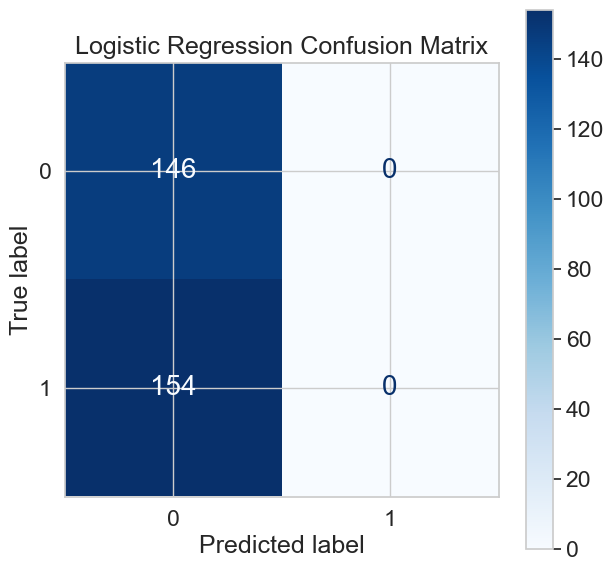

In [93]:
# Logistic Regression
from sklearn.linear_model import LogisticRegression 
logreg = LogisticRegression() 
logreg.fit(X_train, y_train)
eval_classification(logreg)
confusionmatrix(logreg)
plt.title('Logistic Regression Confusion Matrix')


Accuracy (Test Set): 0.96
Accuracy (Train Set): 0.97
Precision (Test Set): 0.97
Recall (Test Set): 0.95
F1-Score (Test Set): 0.96
roc_auc (test-proba): 0.99
roc_auc (train-proba): 1.00
recall (crossval train): 0.9664999999999999
recall (crossval test): 0.954
[[141   5]
 [  8 146]]


Text(0.5, 1.0, 'Logistic Regression Confusion Matrix')

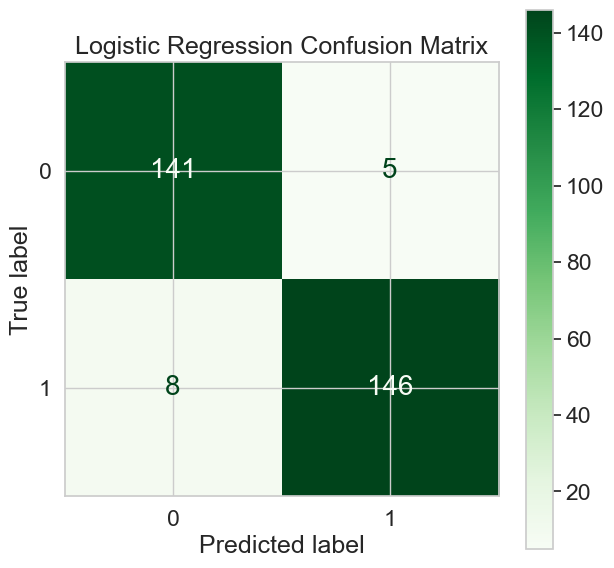

In [94]:
# Logistic Regression with Scaled Data
from sklearn.linear_model import LogisticRegression
logreg_s = LogisticRegression() 
logreg_s.fit(X_scaled_train, y_scaled_train)
eval_classification_scaled(logreg_s)
confusionmatrix_scaled(logreg_s)
plt.title('Logistic Regression Confusion Matrix')

## 3.2 Decision Tree

Accuracy (Test Set): 0.94
Accuracy (Train Set): 1.00
Precision (Test Set): 0.95
Recall (Test Set): 0.94
F1-Score (Test Set): 0.94
roc_auc (test-proba): 0.94
roc_auc (train-proba): 1.00
recall (crossval train): 1.0
recall (crossval test): 0.9420000000000002
[[138   8]
 [ 10 144]]


Text(0.5, 1.0, 'Decision Tree Confusion Matrix')

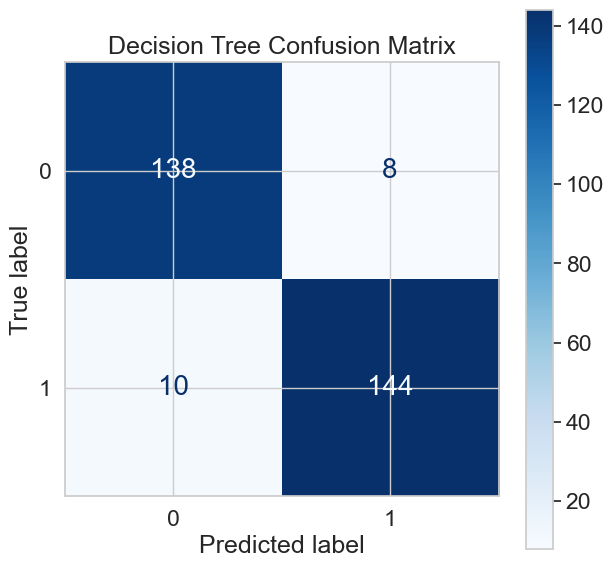

In [120]:
# Decision Tree
from sklearn.tree import DecisionTreeClassifier 
dt = DecisionTreeClassifier() 
dt.fit(X_train, y_train)
eval_classification(dt)
confusionmatrix(dt)
plt.title('Decision Tree Confusion Matrix')

Accuracy (Test Set): 0.94
Accuracy (Train Set): 1.00
Precision (Test Set): 0.94
Recall (Test Set): 0.94
F1-Score (Test Set): 0.94
roc_auc (test-proba): 0.94
roc_auc (train-proba): 1.00
recall (crossval train): 1.0
recall (crossval test): 0.942
[[137   9]
 [ 10 144]]


Text(0.5, 1.0, 'Decision Tree Confusion Matrix')

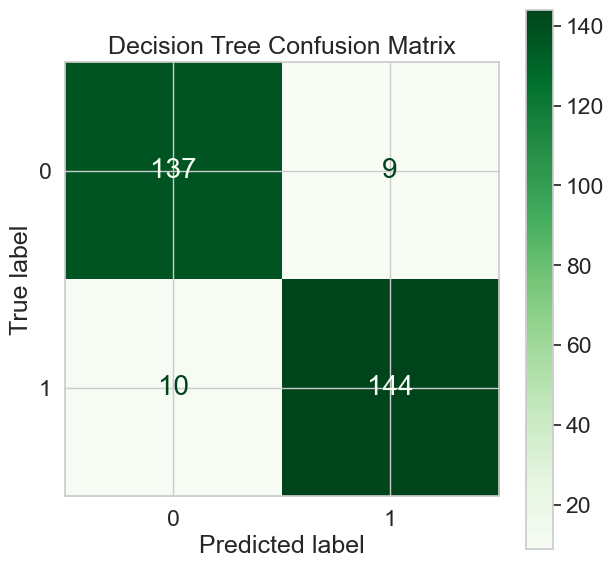

In [121]:
# Decision Tree with Scaled Data
from sklearn.tree import DecisionTreeClassifier 
dt = DecisionTreeClassifier() 
dt.fit(X_scaled_train, y_scaled_train)
eval_classification_scaled(dt)
confusionmatrix_scaled(dt)
plt.title('Decision Tree Confusion Matrix')

## 3.3 Random Forest

Accuracy (Test Set): 0.96
Accuracy (Train Set): 1.00
Precision (Test Set): 0.97
Recall (Test Set): 0.95
F1-Score (Test Set): 0.96
roc_auc (test-proba): 0.98
roc_auc (train-proba): 1.00
recall (crossval train): 1.0
recall (crossval test): 0.954
[[141   5]
 [  8 146]]


Text(0.5, 1.0, 'Random Forest Confusion Matrix')

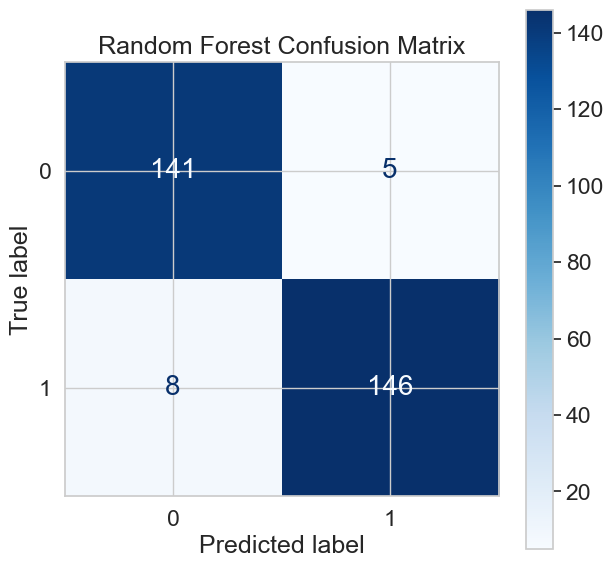

In [122]:
# Random Forest
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(X_train,y_train)
eval_classification(rf)
confusionmatrix(rf)
plt.title('Random Forest Confusion Matrix')

Accuracy (Test Set): 0.96
Accuracy (Train Set): 1.00
Precision (Test Set): 0.96
Recall (Test Set): 0.96
F1-Score (Test Set): 0.96
roc_auc (test-proba): 0.99
roc_auc (train-proba): 1.00
recall (crossval train): 1.0
recall (crossval test): 0.96
[[140   6]
 [  6 148]]


Text(0.5, 1.0, 'Random Forest Confusion Matrix')

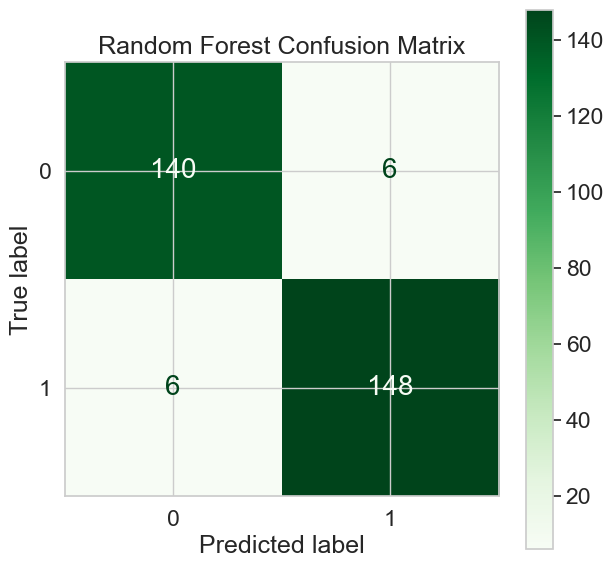

In [123]:
# Random Forest with Scaled Data
from sklearn.tree import DecisionTreeClassifier 
rf = RandomForestClassifier()
rf.fit(X_scaled_train, y_scaled_train)
eval_classification_scaled(rf)
confusionmatrix_scaled(rf)
plt.title('Random Forest Confusion Matrix')

## 3.4 kNearest Classifier

Accuracy (Test Set): 0.68
Accuracy (Train Set): 0.78
Precision (Test Set): 0.71
Recall (Test Set): 0.64
F1-Score (Test Set): 0.67
roc_auc (test-proba): 0.70
roc_auc (train-proba): 0.86
recall (crossval train): 0.721
recall (crossval test): 0.6220000000000001
[[106  40]
 [ 56  98]]


Text(0.5, 1.0, 'kNearest Classifier Confusion Matrix')

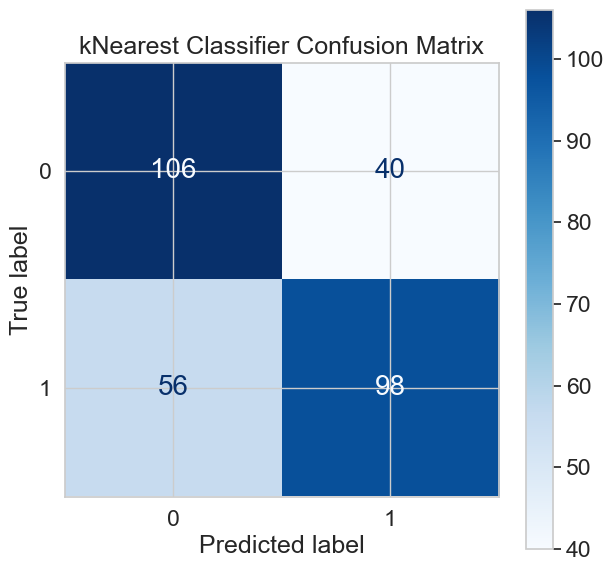

In [124]:
# kNearest Classifier
from sklearn.neighbors import KNeighborsClassifier
knc= KNeighborsClassifier()
knc.fit(X_train,y_train)
eval_classification(knc)
confusionmatrix(knc)
plt.title('kNearest Classifier Confusion Matrix')

Accuracy (Test Set): 0.94
Accuracy (Train Set): 0.96
Precision (Test Set): 0.99
Recall (Test Set): 0.90
F1-Score (Test Set): 0.94
roc_auc (test-proba): 0.98
roc_auc (train-proba): 1.00
recall (crossval train): 0.9345000000000001
recall (crossval test): 0.9120000000000001
[[144   2]
 [ 15 139]]


Text(0.5, 1.0, 'kNearest Classifier Confusion Matrix')

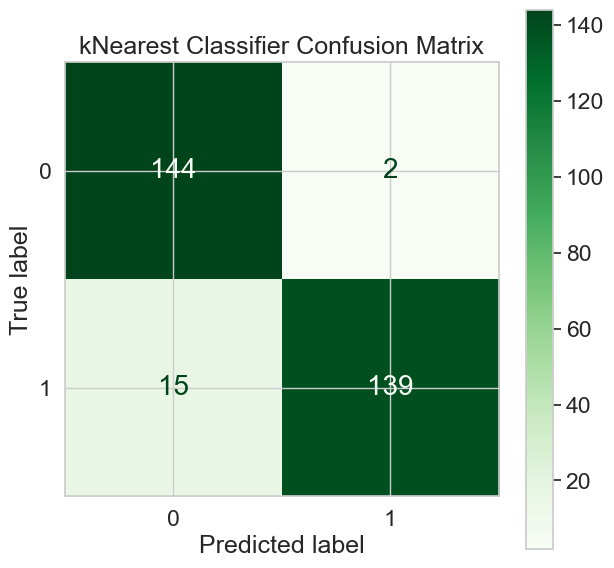

In [125]:
# kNearest Classifier with Scaled Data
from sklearn.neighbors import KNeighborsClassifier
knc= KNeighborsClassifier()
knc.fit(X_scaled_train,y_scaled_train)
eval_classification_scaled(knc)
confusionmatrix_scaled(knc)
plt.title('kNearest Classifier Confusion Matrix')

## 3.5 XGBoost Classifier

Accuracy (Test Set): 0.95
Accuracy (Train Set): 1.00
Precision (Test Set): 0.96
Recall (Test Set): 0.94
F1-Score (Test Set): 0.95
roc_auc (test-proba): 0.98
roc_auc (train-proba): 1.00
recall (crossval train): 1.0
recall (crossval test): 0.9400000000000001
[[140   6]
 [ 10 144]]


Text(0.5, 1.0, 'XGBoost Classifier Confusion Matrix')

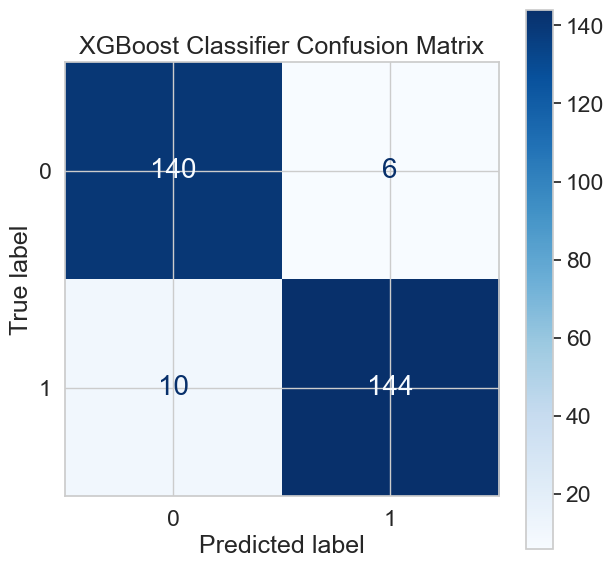

In [126]:
from xgboost import XGBClassifier
xgbc= XGBClassifier(random_state=42)
xgbc.fit(X_train,y_train)
eval_classification(xgbc)
confusionmatrix(xgbc)
plt.title('XGBoost Classifier Confusion Matrix')

Accuracy (Test Set): 0.95
Accuracy (Train Set): 1.00
Precision (Test Set): 0.96
Recall (Test Set): 0.94
F1-Score (Test Set): 0.95
roc_auc (test-proba): 0.98
roc_auc (train-proba): 1.00
recall (crossval train): 1.0
recall (crossval test): 0.9400000000000001
[[140   6]
 [ 10 144]]


Text(0.5, 1.0, 'XGBoost Classifier Confusion Matrix')

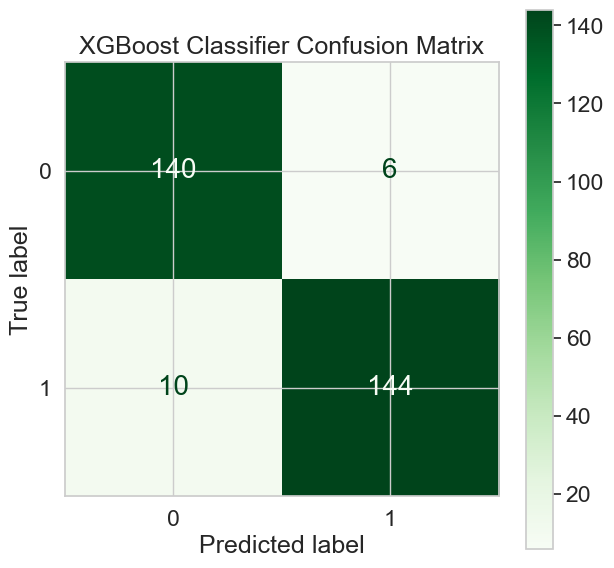

In [127]:
# XGBoost with Scaled data
from xgboost import XGBClassifier
xgbc= XGBClassifier(random_state=42)
xgbc.fit(X_scaled_train,y_scaled_train)
eval_classification_scaled(xgbc)
confusionmatrix_scaled(xgbc)
plt.title('XGBoost Classifier Confusion Matrix')

## Model Comparison

In [133]:
import pandas as pd

# Create dictionary for each model's score
scores = {
    'Logistic Regression': {'Accuracy': 0.49,'Precision': 0.00,'Recall': 0.00,'F1-Score': 0.00}, 
    'Scaled Logistic Regression': {'Accuracy': 0.96,'Precision': 0.97,'Recall': 0.95,'F1-Score': 0.96},
    'Decision Tree': {'Accuracy': 0.94,'Precision': 0.95,'Recall': 0.94,'F1-Score': 0.94},
    'Scaled Decision Tree': {'Accuracy': 0.94,'Precision': 0.94,'Recall': 0.94,'F1-Score': 0.94},
    'Random Forest': { 'Accuracy': 0.96,'Precision': 0.97,'Recall': 0.95,'F1-Score': 0.96},
    'Scaled Random Forest': {'Accuracy': 0.96,'Precision': 0.96,'Recall': 0.96,'F1-Score': 0.96},
    'kNearest Classifier': {'Accuracy': 0.68,'Precision': 0.71,'Recall': 0.64,'F1-Score': 0.67},
    'Scaled kNearest Classifier': {'Accuracy': 0.94,'Precision': 0.99,'Recall': 0.90,'F1-Score': 0.94},
    'XGBoost Classifier': {'Accuracy': 0.95,'Precision': 0.96,\'Recall': 0.94,'F1-Score': 0.95},
    'Scaled XGBoost Classifier': {'Accuracy': 0.95,'Precision': 0.96,'Recall': 0.94,'F1-Score': 0.95}
    }

df_scores = pd.DataFrame(scores)
print(df_scores)

           Logistic Regression  Scaled Logistic Regression  Decision Tree  \
Accuracy                  0.49                        0.96           0.94   
Precision                 0.00                        0.97           0.95   
Recall                    0.00                        0.95           0.94   
F1-Score                  0.00                        0.96           0.94   

           Scaled Decision Tree  Random Forest  Scaled Random Forest  \
Accuracy                   0.94           0.96                  0.96   
Precision                  0.94           0.97                  0.96   
Recall                     0.94           0.95                  0.96   
F1-Score                   0.94           0.96                  0.96   

           kNearest Classifier  Scaled kNearest Classifier  \
Accuracy                  0.68                        0.94   
Precision                 0.71                        0.99   
Recall                    0.64                        0.90   
F1-Sc

In [134]:
df_scores.head()

,Logistic Regression,Scaled Logistic Regression,Decision Tree,Scaled Decision Tree,Random Forest,Scaled Random Forest,kNearest Classifier,Scaled kNearest Classifier,XGBoost Classifier,Scaled XGBoost Classifier
Accuracy,0.49,0.96,0.94,0.94,0.96,0.96,0.68,0.94,0.95,0.95
Precision,0.00,0.97,0.95,0.94,0.97,0.96,0.71,0.99,0.96,0.96
Recall,0.00,0.95,0.94,0.94,0.95,0.96,0.64,0.90,0.94,0.94
F1-Score,0.00,0.96,0.94,0.94,0.96,0.96,0.67,0.94,0.95,0.95


Clicked Ads Customer Classification

'F1 Score' is used as the benchmark to select the best model as it represents the mean of precision and recall score. 
Precision score measures the ability of the model to prevent false positive which in this case predicting a customer will click an ad when actually they won't. If this prediction happens, hence, the customer will be given the ads, resulting in budget wasting. 
Recall score measures the ability of the model prevent false negative which in this case predicting a customer won't click an ad when they actually will. If this prediction happens, hence, the potential customer won't be given the ads, resulting in potential profit loss. 
By using 'F1' score, loss of budget and loss of potential profit can be minimize.

Based on the score above, scaled logistic regression and scaled random forest have the highest F1 score. 

## 3.3 Feature Importance

In [112]:
from sklearn.linear_model import LogisticRegression
model=LogisticRegression(random_state=1)
features= X_scaled_train
model.fit(features,y_scaled_train)

# make new data frame for feature importance
feature_importance=pd.DataFrame({'feature':list(features.columns),'feature_importance':[abs(i) for i in model.coef_[0]]})

,feature,feature_importance
3,Daily Internet Usage,2.751800
0,Daily Time Spent on Site,2.442771
2,Area Income,1.498895
1,Age,1.214980
43,category_Furniture,1.021086
25,city_Palembang,0.719300
47,category_Travel,0.714628
38,category_Bank,0.693226
45,category_House,0.655670
17,city_Jakarta Selatan,0.469370


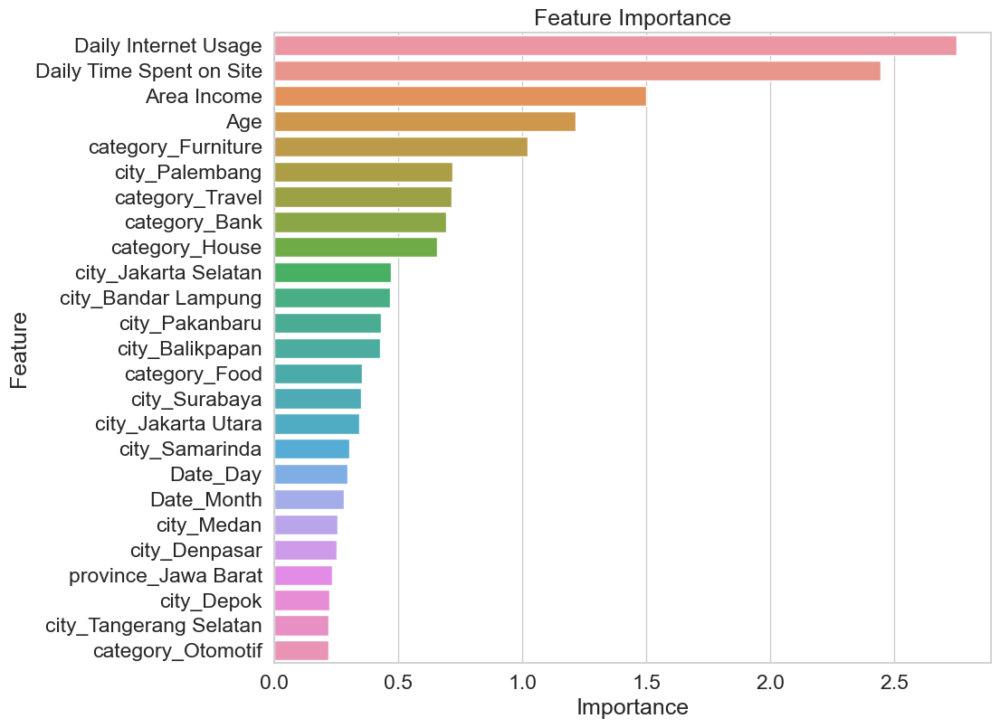

In [121]:
feature_importance_sorted = feature_importance.sort_values(by='feature_importance', ascending=False)

# Select top 25 features
top_25_features = feature_importance_sorted.head(25)

# Create the horizontal barplot using Seaborn
sns.barplot(x='feature_importance', y='feature', data=top_25_features)  # Swap x and y for horizontal plot

# Customize the plot
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout()  # Adjust spacing to avoid clipping labels

plt.show()

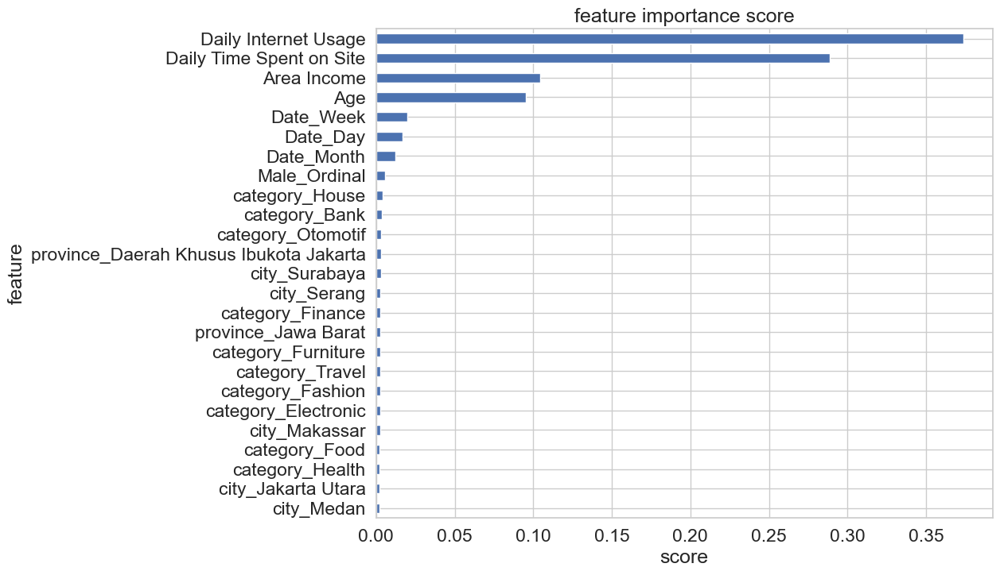

In [88]:
show_feature_importance(rf)